#Αποκατάσταση εικόνας

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
from google.colab.patches import cv2_imshow #this is used for imshow to work on google colab
from google.colab import drive
import sys
import os
from skimage.util import random_noise


drive.mount('/content/gdrive')
lib_file_location = "/content/gdrive/My Drive/Courses/TEL 750 - Digital Image Processing/"
sys.path.append(lib_file_location)


Mounted at /content/gdrive


In [2]:
## Resize function

def resize_image(image, width=None, height=None, inter=cv2.INTER_AREA):
    """
    Resize an image to a specified width and/or height while maintaining aspect ratio if desired.

    Parameters:
    image: numpy array of the image
    width: desired width in pixels (optional)
    height: desired height in pixels (optional)
    inter: interpolation method (default: cv2.INTER_AREA)

    Returns:
    resized image as numpy array
    """
    # Get the image's original dimensions
    dim = None
    (h, w) = image.shape[:2]

    # If both width and height are None, return original image
    if width is None and height is None:
        return image

    # If width is None, calculate it from height
    if width is None:
        r = height / float(h)
        dim = (int(w * r), height)

    # If height is None, calculate it from width
    else:
        r = width / float(w)
        dim = (width, int(h * r))

    # Perform the resizing
    resized = cv2.resize(image, dim, interpolation=inter)
    return resized

Initial dimensions 400 X 400


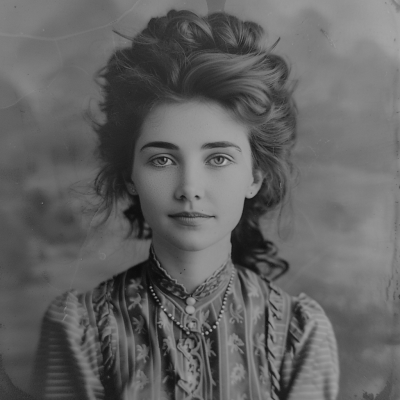

In [3]:
# Read / Show an image
img_file = '/content/gdrive/MyDrive/Courses/TEL 750 - Digital Image Processing/old_photo_1.png'
image = cv2.imread(img_file) # this image is in BGR format

# Resize using my own resize function
image = resize_image(image, width=400)
# Convert image to grayscale
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
print('Initial dimensions', gray_image.shape[0], 'X', gray_image.shape[1])
cv2_imshow(gray_image)

##Δημιουργία θορύβου

### Salt and Pepper noise

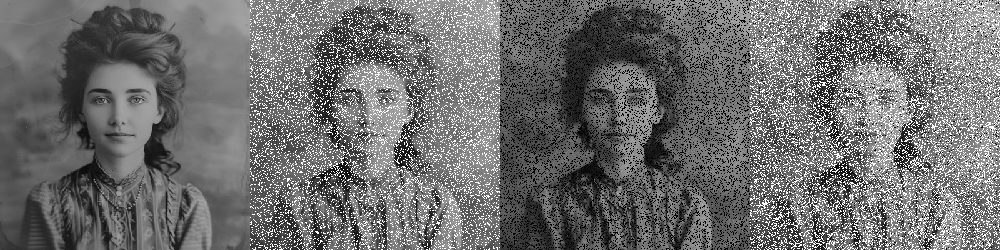

In [4]:
# Add Salt noise to the image.
salt_noise_img = random_noise(gray_image, mode='salt', amount=0.2)
salt_noise_img = np.array(255*salt_noise_img, dtype = 'uint8') #from range [0,1] to uint8

# Add Pepper noise to the image.
pepper_noise_img = random_noise(gray_image, mode='pepper', amount=0.2)
pepper_noise_img = np.array(255*pepper_noise_img, dtype = 'uint8') #from range [0,1] to uint8

# Add Salt & Pepper noise to the image.
sp_noise_img = random_noise(gray_image, mode='s&p', amount=0.3, salt_vs_pepper=0.9)
sp_noise_img = np.array(255*sp_noise_img, dtype = 'uint8') #from range [0,1] to uint8

#Show different types of noise
res = np.hstack((gray_image, salt_noise_img, pepper_noise_img, sp_noise_img))
cv2_imshow(res)


### Gaussian noise

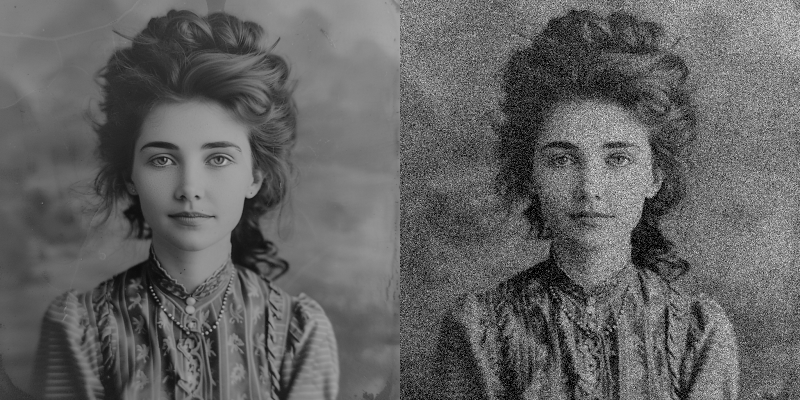

In [5]:
# Add Gaussian noise to the image.
gaussian_noise_image = random_noise(gray_image, mode='gaussian',mean=0, var = 0.01, clip=True)
gaussian_noise_image = np.array(255*gaussian_noise_image, dtype = 'uint8') #from range [0,1] to uint8
#Show different types of noise
res = np.hstack((gray_image, gaussian_noise_image))
cv2_imshow(res)

##Φίλτρα μέσου όρου

###Φίλτρο αριθμητικού μέσου

#### Εφαρμογή του φίλτρου αριθμητικού μέσου στην περίπτωση θορύβου Gauss

In [6]:
def norm_image(img):
  img = np.array(255*(img-np.min(img))/(np.max(img)-np.min(img)),dtype='uint8')
  return img

### Filtering Salt / Pepper noise with Gaussian Filter

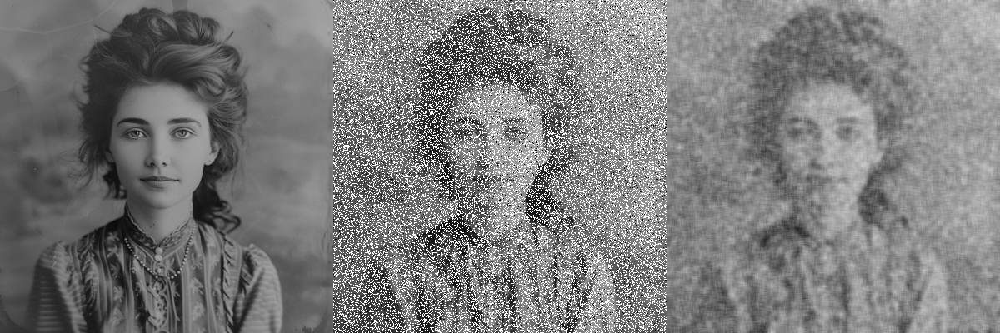

In [7]:
denoise_img = cv2.blur(sp_noise_img,(7,7))
#Show different types of noise
res = np.hstack((gray_image, sp_noise_img,denoise_img))
cv2_imshow(res)

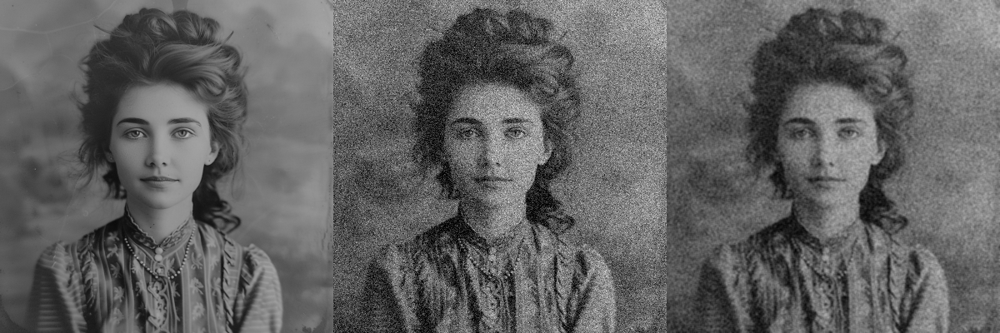

In [8]:
denoise_img = cv2.blur(gaussian_noise_image,(3,3))
#Show different types of noise
res = np.hstack((gray_image, gaussian_noise_image,denoise_img))
cv2_imshow(res)

#### Εφαρμογή του φίλτρου αριθμητικού μέσου στην περίπτωση αλατοπίπερου

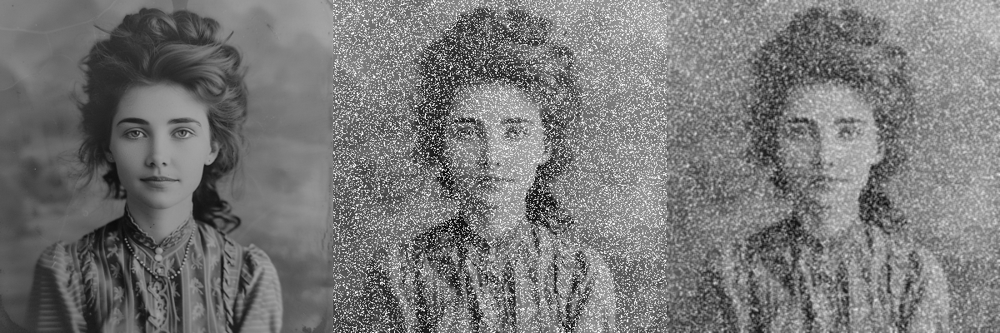

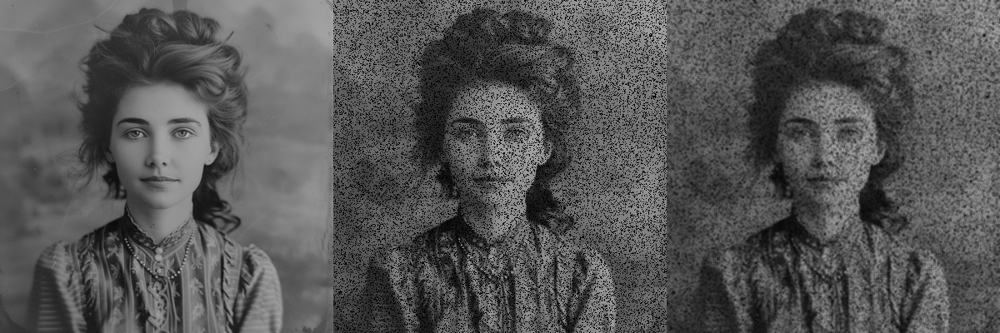

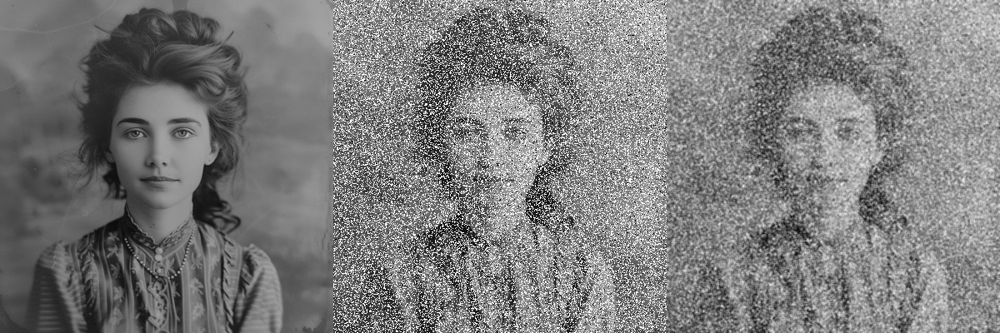

In [9]:
denoise_img = cv2.blur(salt_noise_img,(3,3))
#Show different types of noise
res = np.hstack((gray_image, salt_noise_img,denoise_img))
cv2_imshow(res)

denoise_img = cv2.blur(pepper_noise_img,(3,3))
#Show different types of noise
res = np.hstack((gray_image, pepper_noise_img,denoise_img))
cv2_imshow(res)

denoise_img = cv2.blur(sp_noise_img,(3,3))
#Show different types of noise
res = np.hstack((gray_image, sp_noise_img,denoise_img))
cv2_imshow(res)

# Φίλτρο γεωμετρικού μέσου

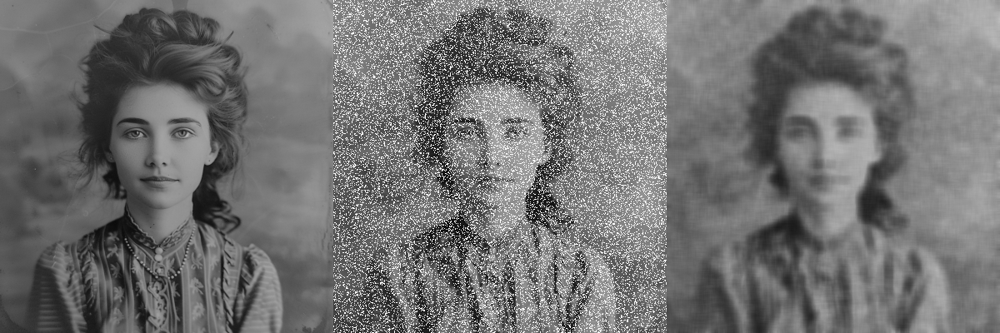

In [10]:
def geometric_mean(img, ksize):
    # Ensure odd kernel size
    if ksize % 2 == 0:
        ksize = ksize + 1

    # Get image dimensions
    x, y = img.shape[:2]
    padding = ksize // 2

    # Create padded image
    padded_img = np.pad(img, padding, mode='edge')

    # Initialize output array
    result = np.zeros((x, y), dtype='float32')

    # Process each pixel
    for r in range(x):
        for c in range(y):
            # Extract window and compute geometric mean
            window = padded_img[r:r+ksize, c:c+ksize]
            # Take log, average, then exp to avoid numerical underflow
            log_window = np.log1p(window)  # log1p(x) = log(1 + x)
            mean_log = np.mean(log_window)
            result[r, c] = np.expm1(mean_log)  # expm1(x) = exp(x) - 1

    return result

# Test the filter
geo_mean = geometric_mean(salt_noise_img, 11)

# Show results
res = np.hstack((gray_image, salt_noise_img, geo_mean.astype(np.uint8)))
cv2_imshow(res)

###Φίλτρο αρμονικού μέσου

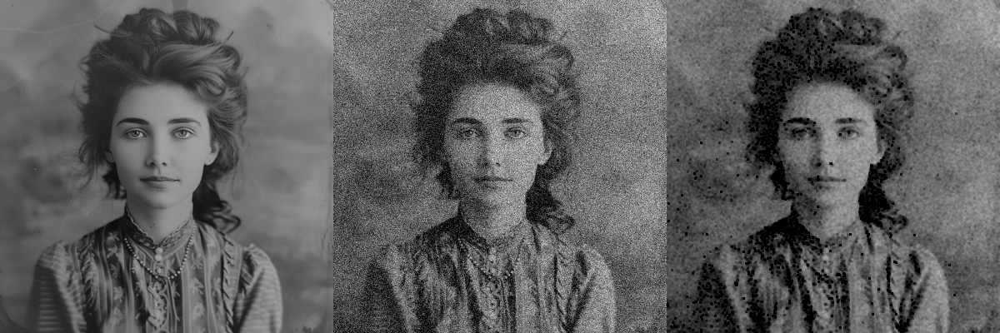

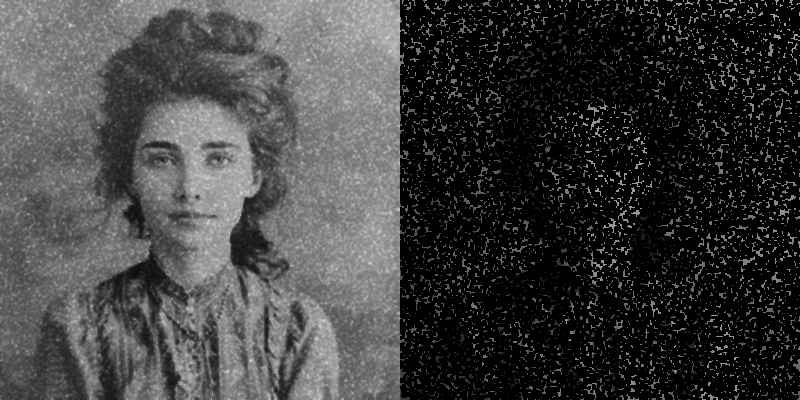

In [11]:
from scipy import stats


def harmonic_mean(img, ksize):
    """
    Efficient implementation of harmonic mean filter using vectorized operations

    Parameters:
        img: Input image
        ksize: Kernel size (odd number)
    """
    # Input validation
    if ksize % 2 == 0:
        raise ValueError("Kernel size must be odd")

    x, y = img.shape[:2]
    padsize = int((ksize-1)/2)
    pad_img = cv2.copyMakeBorder(img, *[padsize]*4, cv2.BORDER_DEFAULT)

    # Create a view of the padded image using as_strided
    from numpy.lib.stride_tricks import as_strided

    # Calculate the shape and strides for the sliding window view
    window_shape = (x, y, ksize, ksize)
    x_stride, y_stride = pad_img.strides[:2]

    window_strides = (x_stride, y_stride, x_stride, y_stride)

    # Create sliding window view
    windows = as_strided(pad_img,
                        shape=window_shape,
                        strides=window_strides,
                        writeable=False)

    # Reshape windows to 2D array where each row is a flattened window
    windows_reshaped = windows.reshape(x*y, ksize*ksize)

    # Calculate harmonic mean for all windows at once
    harmonic_means = stats.hmean(windows_reshaped, axis=1)

    # Reshape result back to image dimensions
    return harmonic_means.reshape(x, y)



harm_img = harmonic_mean(gaussian_noise_image, 3)
harm_img2 = harmonic_mean(salt_noise_img, 3)
harm_img3 = harmonic_mean(pepper_noise_img, 3)

#Show different types of noise
res = np.hstack((gray_image, gaussian_noise_image, harm_img))
cv2_imshow(res)

res = np.hstack((harm_img2, harm_img3))
cv2_imshow(res)


###Φίλτρο αντι-αρμονικού μέσου

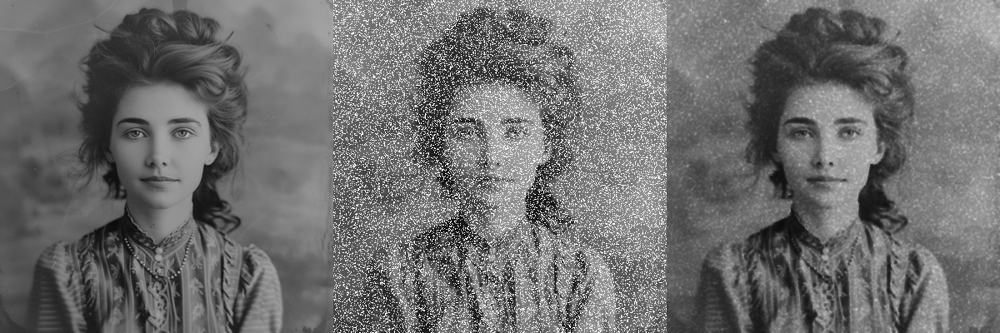

<ipython-input-12-6ac7d1b5e244>:5: RuntimeWarning: invalid value encountered in divide
  result = cv2.filter2D(num, -1, kernel) / cv2.filter2D(denom, -1, kernel)
/usr/local/lib/python3.10/dist-packages/google/colab/patches/__init__.py:18: RuntimeWarning: invalid value encountered in cast
  a = a.clip(0, 255).astype('uint8')


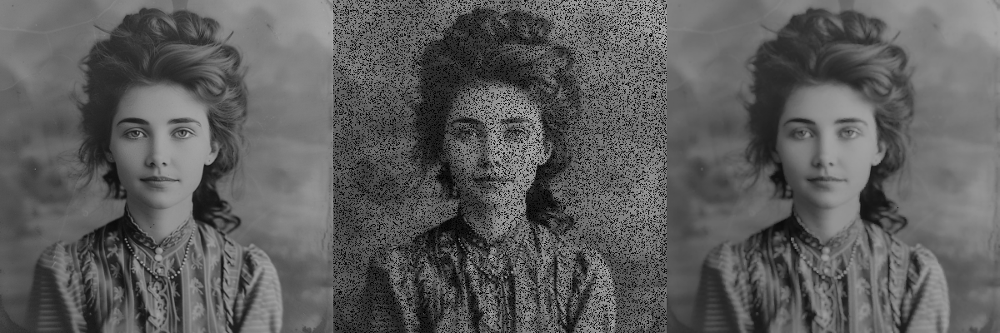

In [12]:
def contraharmonic_mean(img, size, Q):
    num = np.power(img, Q + 1)
    denom = np.power(img, Q)
    kernel = np.full(size, 1.0)
    result = cv2.filter2D(num, -1, kernel) / cv2.filter2D(denom, -1, kernel)
    return result

contra_harm_img = contraharmonic_mean(salt_noise_img, (3,3), -1.5)

#Show different types of noise
res = np.hstack((gray_image, salt_noise_img, contra_harm_img))
cv2_imshow(res)

contra_harm_img = contraharmonic_mean(pepper_noise_img, (3,3), 1.5)

#Show different types of noise
res = np.hstack((gray_image, pepper_noise_img, contra_harm_img))
cv2_imshow(res)

### Δοκιμή με θόρυβο salt & pepper

<ipython-input-12-6ac7d1b5e244>:2: RuntimeWarning: divide by zero encountered in power
  num = np.power(img, Q + 1)
<ipython-input-12-6ac7d1b5e244>:3: RuntimeWarning: divide by zero encountered in power
  denom = np.power(img, Q)
<ipython-input-12-6ac7d1b5e244>:5: RuntimeWarning: invalid value encountered in divide
  result = cv2.filter2D(num, -1, kernel) / cv2.filter2D(denom, -1, kernel)


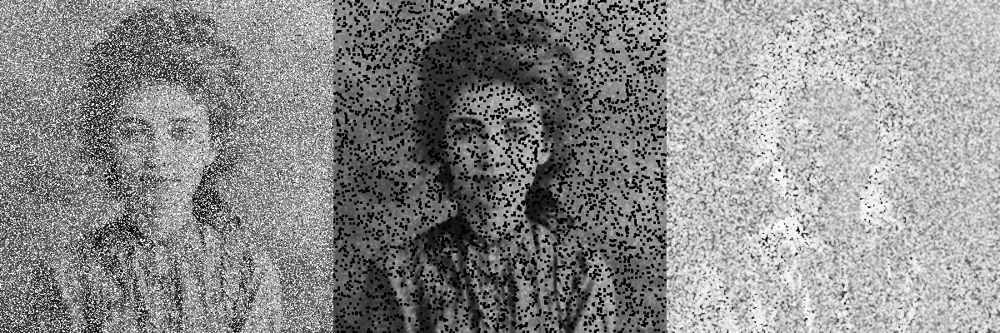

In [13]:
contra_harm_img1 = contraharmonic_mean(sp_noise_img, (3,3), -1.5)
contra_harm_img2 = contraharmonic_mean(sp_noise_img, (3,3), 1.5)
#Show different types of noise
res = np.hstack((sp_noise_img, contra_harm_img1, contra_harm_img2))
cv2_imshow(res)

##Φίλτρα στατιστικής διάταξης

###Φίλτρο ενδιάμεσης τιμής (median)

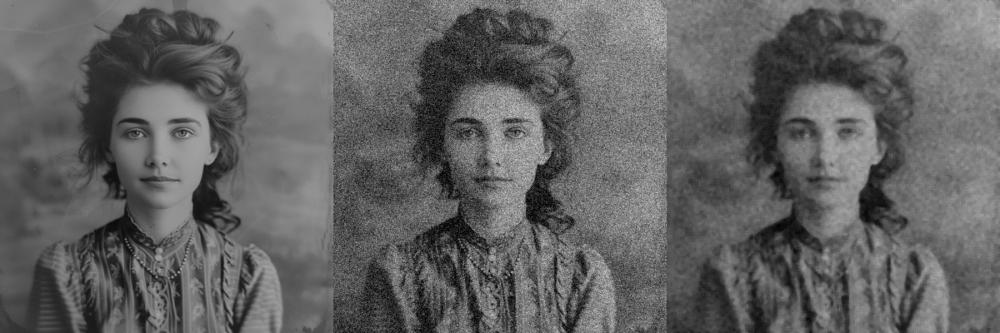

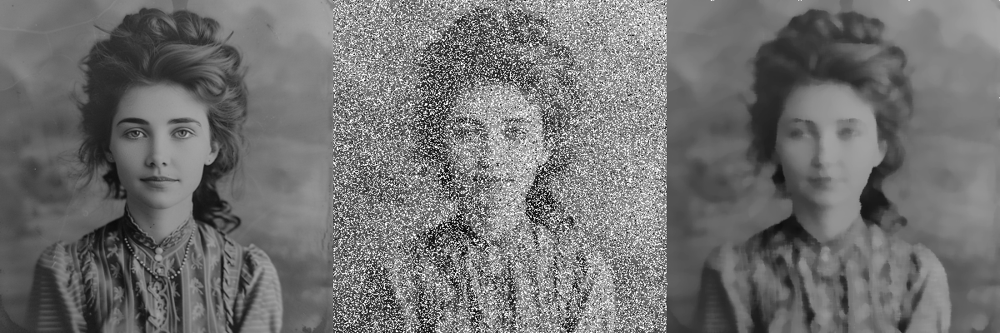

In [14]:
median_img = cv2.medianBlur(gaussian_noise_image,5)

#Show different types of noise
res = np.hstack((gray_image, gaussian_noise_image, median_img))
cv2_imshow(res)

median_img = cv2.medianBlur(sp_noise_img,9)
#Show different types of noise
res = np.hstack((gray_image, sp_noise_img, median_img))
cv2_imshow(res)

### Φίλτρο μέγιστου και ελάχιστου

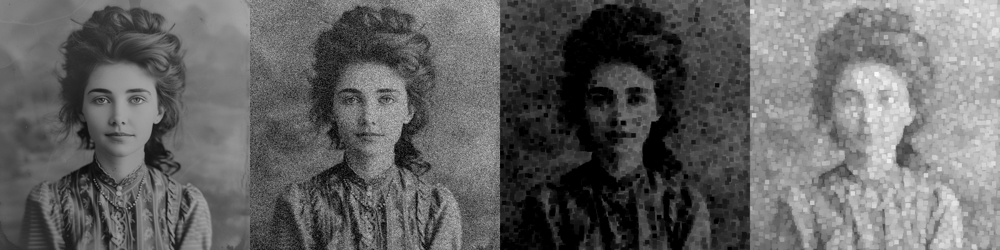

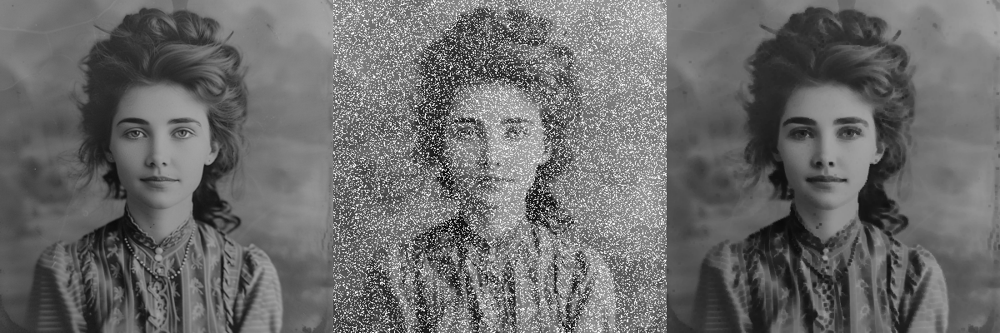

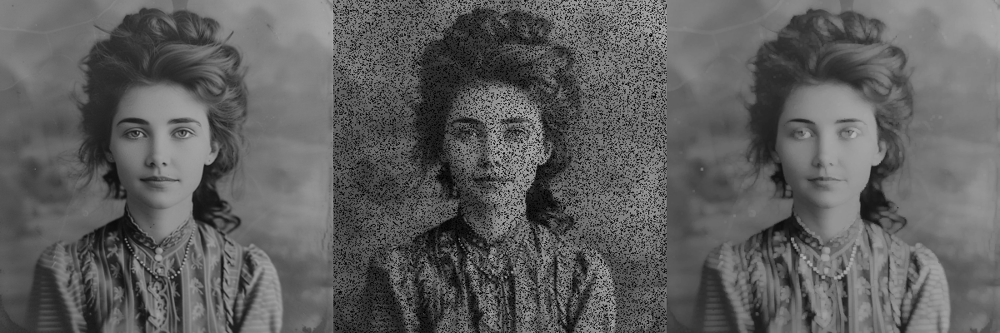

In [15]:
# Φίλτρο ελάχιστου
def minimumBoxFilter(img, n):

  # Creates the shape of the kernel
  size = (n, n)
  shape = cv2.MORPH_RECT
  kernel = cv2.getStructuringElement(shape, size)
  # Applies the minimum filter with kernel NxN
  imgResult = cv2.erode(img, kernel)
  return imgResult

# Φίλτρο μέγιστου
def maximumBoxFilter(img, n):
  # Creates the shape of the kernel
  size = (n,n)
  shape = cv2.MORPH_RECT
  kernel = cv2.getStructuringElement(shape, size)
  # Applies the maximum filter with kernel NxN
  imgResult = cv2.dilate(img, kernel)
  return imgResult

#Εφαρμογή των φίλτρων σε Gaussian θόρυβο
min_img = minimumBoxFilter(gaussian_noise_image,7 )
max_img = maximumBoxFilter(gaussian_noise_image,7 )

#Show different types of noise
res = np.hstack((gray_image, gaussian_noise_image, min_img, max_img))
cv2_imshow(res)

#Εφαρμογή των φίλτρων σε αλατοπίπερο θόρυβο
min_img = minimumBoxFilter(salt_noise_img,3 )
max_img = maximumBoxFilter(pepper_noise_img,3 )

#Show different types of noise
res = np.hstack((gray_image, salt_noise_img, min_img))
cv2_imshow(res)
#Show different types of noise
res = np.hstack((gray_image, pepper_noise_img, max_img))
cv2_imshow(res)

###Φίλτρο μεσαίου σημείου

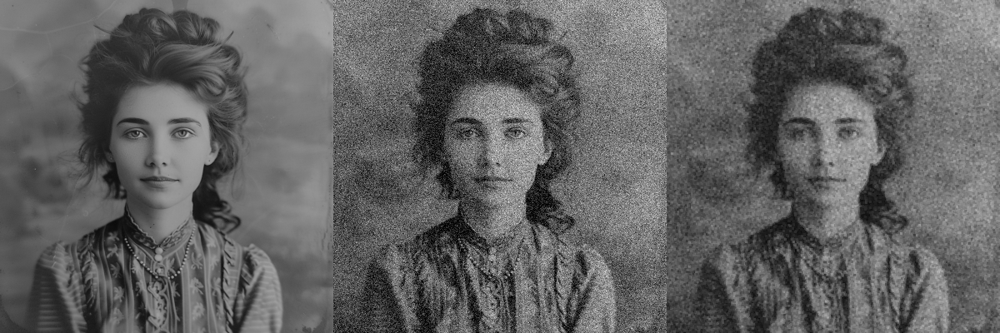

In [17]:
def midpoint(img, kernel):
    # Convert to float32 for processing
    img = img.astype(np.float32)

    # Apply filters
    maxf = maximumBoxFilter(img, kernel)
    minf = minimumBoxFilter(img,kernel)

    # Calculate midpoint
    midpoint = (maxf + minf) / 2.0

    # Convert back to uint8 for display
    midpoint = np.clip(midpoint, 0, 255).astype(np.uint8)

    return midpoint, maxf, minf

# Apply filter
midpoint_img, maxf, minf = midpoint(gaussian_noise_image, 9)

# Ensure all images are uint8 before stacking
gray_image_uint8 = gray_image.astype(np.uint8)
gaussian_noise_image_uint8 = gaussian_noise_image.astype(np.uint8)

# Stack images horizontally
res = np.hstack((gray_image_uint8, gaussian_noise_image_uint8, midpoint_img))

# Apply the corrected filter
midpoint_img, maxf, minf = midpoint(gaussian_noise_image, 3)

# Stack images horizontally for comparison
res = np.hstack((gray_image, gaussian_noise_image, midpoint_img))
cv2_imshow(res)

###Alpha-trimmed φίλτρο μέσου

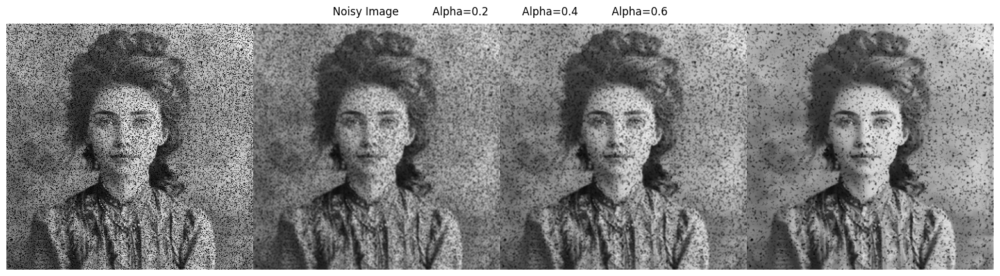

In [18]:
import numpy as np
import cv2
from scipy.ndimage import uniform_filter

def alpha_trimmed_mean(img, kernel_size, alpha):
    """
    Implements alpha-trimmed mean filter.

    Parameters:
        img: Input image (grayscale)
        kernel_size: Size of the kernel window (odd number)
        alpha: Trimming parameter in range [0, 1]
            0 = mean filter (no trimming)
            1 = median filter (maximum trimming)

    Returns:
        Filtered image
    """
    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be odd")
    if not 0 <= alpha < 1:
        raise ValueError("Alpha must be in range [0, 1)")

    # Add padding to handle borders
    pad = kernel_size // 2
    padded = cv2.copyMakeBorder(img, pad, pad, pad, pad, cv2.BORDER_REFLECT)

    # Get image dimensions
    rows, cols = img.shape
    result = np.zeros_like(img)

    # Calculate number of pixels to trim from each end
    window_size = kernel_size * kernel_size
    trim = int(alpha * window_size // 2)

    # Process each pixel
    for i in range(rows):
        for j in range(cols):
            # Extract window
            window = padded[i:i+kernel_size, j:j+kernel_size].flatten()
            # Sort values
            sorted_window = np.sort(window)
            # Trim alpha/2 values from both ends
            trimmed = sorted_window[trim:window_size-trim]
            # Calculate mean of remaining values
            result[i, j] = np.mean(trimmed)

    return result

def alpha_trimmed_mean_vectorized(img, kernel_size, alpha):
    """
    Vectorized implementation of alpha-trimmed mean filter.
    Much faster than the pixel-by-pixel version.
    """
    if kernel_size % 2 == 0:
        raise ValueError("Kernel size must be odd")
    if not 0 <= alpha < 1:
        raise ValueError("Alpha must be in range [0, 1)")

    # Add padding
    pad = kernel_size // 2
    padded = cv2.copyMakeBorder(img, pad, pad, pad, pad, cv2.BORDER_REFLECT)

    # Calculate number of pixels to trim
    window_size = kernel_size * kernel_size
    trim = int(alpha * window_size // 2)

    # Create a view of the image with sliding windows
    windows = np.lib.stride_tricks.sliding_window_view(
        padded, (kernel_size, kernel_size)
    )

    # Reshape to 2D array where each row is a flattened window
    windows_reshaped = windows.reshape(-1, window_size)

    # Sort each window
    sorted_windows = np.sort(windows_reshaped, axis=1)

    # Trim alpha/2 values from both ends and calculate mean
    trimmed_mean = np.mean(sorted_windows[:, trim:window_size-trim], axis=1)

    # Reshape back to image dimensions
    return trimmed_mean.reshape(img.shape)

noisy_image = pepper_noise_img

# Try different alpha values
alpha_03 = alpha_trimmed_mean_vectorized(noisy_image, 3, 0.2)
alpha_05 = alpha_trimmed_mean_vectorized(noisy_image, 3, 0.4)
alpha_07 = alpha_trimmed_mean_vectorized(noisy_image, 3, 0.6)

# Display results
res = np.hstack((noisy_image, alpha_03, alpha_05, alpha_07))
plt.figure(figsize=(20,5))
plt.imshow(res, cmap='gray')
plt.title('Noisy Image          Alpha=0.2          Alpha=0.4          Alpha=0.6', pad=10)
plt.axis('off')
plt.show()


##Προσαρμοζόμενα φίλτρα

### Προσαρμοζόμενα φίλτρα μείωσης τοπικού θορύβου (Μπορείτε να δείτε το: Adaptive Noise Filters.ipynb)


###Προσαρμοζόμενο φίλτρο διάμεσου (μπορείτε να δείτε και το Adaptive Median Filter.ipynb)

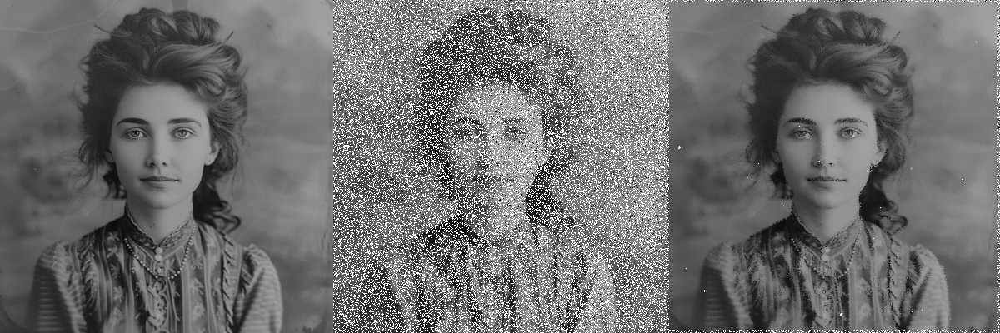

In [19]:
from PIL import Image, ImageFilter

def calculate_median(array):
    """Return the median of 1-d array"""
    sorted_array = np.sort(array) #timsort (O(nlogn))
    median = sorted_array[len(array)//2]
    return median

def level_A(z_min, z_med, z_max, z_xy, S_xy, S_max):
    if(z_min < z_med < z_max):
        return level_B(z_min, z_med, z_max, z_xy, S_xy, S_max)
    else:
        S_xy += 2 #increase the size of S_xy to the next odd value.
        if(S_xy <= S_max): #repeat process
            return level_A(z_min, z_med, z_max, z_xy, S_xy, S_max)
        else:
            return z_med

def level_B(z_min, z_med, z_max, z_xy, S_xy, S_max):
    if(z_min < z_xy < z_max):
        return z_xy
    else:
        return z_med

def amf(image, initial_window, max_window):
    """runs the Adaptive Median Filter proess on an image"""
    xlength, ylength = image.shape #get the shape of the image.

    z_min, z_med, z_max, z_xy = 0, 0, 0, 0
    S_max = max_window
    S_xy = initial_window #dynamically to grow

    output_image = image.copy()

    for row in range(S_xy, xlength-S_xy-1):
        for col in range(S_xy, ylength-S_xy-1):
            filter_window = image[row - S_xy : row + S_xy + 1, col - S_xy : col + S_xy + 1] #filter window
            target = filter_window.reshape(-1) #make 1-dimensional
            z_min = np.min(target) #min of intensity values
            z_max = np.max(target) #max of intensity values
            z_med = calculate_median(target) #median of intensity values
            z_xy = image[row, col] #current intensity

            #Level A & B
            new_intensity = level_A(z_min, z_med, z_max, z_xy, S_xy, S_max)
            output_image[row, col] = new_intensity
    return output_image

amf_img = amf(sp_noise_img, 3, 11)

#Show different types of noise
res = np.hstack((gray_image, sp_noise_img, amf_img))
cv2_imshow(res)

#Υποβάθμιση εικόνας

## Κατασκευή συνάρτησης υποβάθμισης εικόνας με φίλτρα θόλωσης και θόρυβο

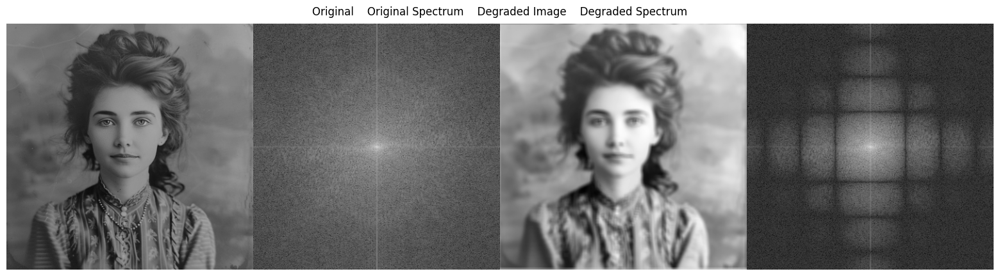

In [20]:
M, N = gray_image.shape[:2]

# 1. Create the blur kernel (Point Spread Function - PSF)
kernel_size = 7
h = np.ones((kernel_size, kernel_size)) / (kernel_size**2)  # normalize for blur
# Pad the kernel to match image size
pad_x = (M - kernel_size) // 2
pad_y = (N - kernel_size) // 2
h_padded = np.pad(h, ((pad_x, M - kernel_size - pad_x),
                      (pad_y, N - kernel_size - pad_y)),
                  mode='constant')
# Center the kernel and transform to frequency domain
h_centered = np.fft.fftshift(h_padded)
H = np.fft.fft2(h_centered)

# 2. Transform image to frequency domain
X = np.fft.fft2(gray_image)

# 3. Apply blur in frequency domain
Y_blur = X * H

# 4. Transform back to spatial domain
blurred_img = np.abs(np.fft.ifft2(Y_blur))

# 5. Add Gaussian noise
sigma = 0.1  # Noise level (increase/decrease as needed)
noise = np.random.normal(0, sigma, gray_image.shape)
degraded_img = blurred_img + noise

# 6. Get frequency spectrum of final degraded image
Y_degraded = np.fft.fft2(degraded_img)

# 7. Display results
# Normalize frequency spectrums for visualization
X_spectrum = np.log(1 + np.abs(np.fft.fftshift(X)))
Y_spectrum = np.log(1 + np.abs(np.fft.fftshift(Y_degraded)))

# Normalize images to [0, 255] for display
def normalize_image(img):
    return ((img - img.min()) * (255.0 / (img.max() - img.min()))).astype(np.uint8)

# Stack results
res = np.hstack((gray_image,
                 normalize_image(X_spectrum),
                 normalize_image(degraded_img),
                 normalize_image(Y_spectrum)))

plt.figure(figsize=(20,5))
plt.imshow(res, cmap='gray')
plt.title('Original    Original Spectrum    Degraded Image    Degraded Spectrum', pad=10)
plt.axis('off')
plt.show()



## Κατασκευή συνάρτησης υποβάθμισης εικόνας με προσομοίωση κίνησης (δείτε το Image Movement Degradation.ipynb)




## Κατασκευή συνάρτησης υποβάθμισης εικόνας (turbulence) (δείτε το Atmospheric turbulance.ipynb)

## Αντίστροφο φιλτράρισμα

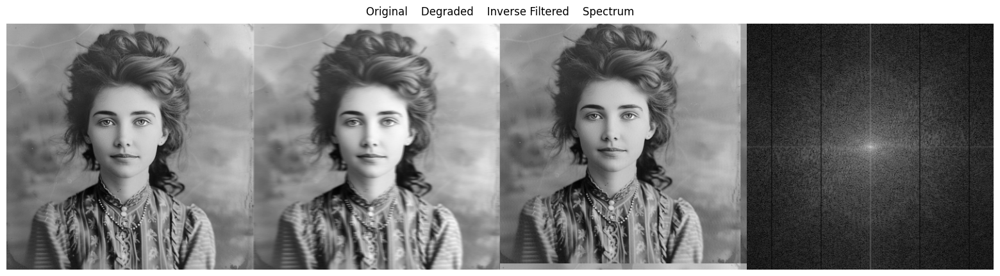

In [21]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# Helper functions
def normalize_image(img):
    return (img - np.min(img)) / (np.max(img) - np.min(img))

def add_gaussian_noise(image, mean=0, std=0.02):
    noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + noise
    return noisy_image

def inverse_filter(degraded_img, H, epsilon=1e-3):
    """
    Apply inverse filtering with proper frequency handling.
    Parameters:
        degraded_img: 2D array, the degraded image.
        H: 2D array, the degradation filter in frequency domain.
        epsilon: float, small constant to prevent division by zero.
    """
    # Transform degraded image to frequency domain
    G = np.fft.fft2(degraded_img)

    # No fftshift for H since it's already in correct frequency arrangement
    # from the PSF transformation

    # Create inverse filter with regularization
    # Use magnitude of H for better stability
    H_mag = np.abs(H)
    # Threshold small values to prevent excessive amplification
    mask = H_mag > epsilon
    H_inv = np.zeros_like(H, dtype=complex)
    H_inv[mask] = 1 / H[mask]

    # Apply filter
    X_est = G * H_inv

    # Transform back to spatial domain
    restored = np.real(np.fft.ifft2(X_est))

    return restored

# Load a grayscale image (replace with your own)
if image.ndim == 3:  # Convert to grayscale if needed
    image = np.mean(image, axis=2)

# Normalize the image
gray_image = normalize_image(image)

# Create a degradation filter (motion blur)
def create_motion_blur_filter(size, angle):
    psf = np.zeros((size, size))
    center = size // 2
    for i in range(size):
        offset = int((i - center) * np.tan(np.radians(angle)))
        if 0 <= center + offset < size:
            psf[center, center + offset] = 1
    psf /= psf.sum()
    return psf

filter_size = 21
angle = 15
psf = create_motion_blur_filter(filter_size, angle)

# Convolve image with motion blur filter
degraded_img = convolve2d(gray_image, psf, mode='same', boundary='wrap')

# Add Gaussian noise
degraded_img = add_gaussian_noise(degraded_img, mean=0, std=0.00005)

# Transform PSF to frequency domain
Hf = np.fft.fft2(psf, s=gray_image.shape)

# Apply inverse filter
epsilon = 1e-3  # Regularization parameter
inverse_img = inverse_filter(degraded_img, Hf, epsilon)

# For visualization
inverse_spectrum = np.log(1 + np.abs(np.fft.fftshift(np.fft.fft2(inverse_img))))

# Stack and display results
res = np.hstack((
    normalize_image(gray_image),
    normalize_image(degraded_img),
    normalize_image(inverse_img),
    normalize_image(inverse_spectrum)
))

plt.figure(figsize=(20, 5))
plt.imshow(res, cmap='gray')
plt.title('Original    Degraded    Inverse Filtered    Spectrum', pad=10)
plt.axis('off')
plt.show()

##Φιλτράρισμα ελάχιστου μέσου τετραγωνικού σφάλματος (Wiener)

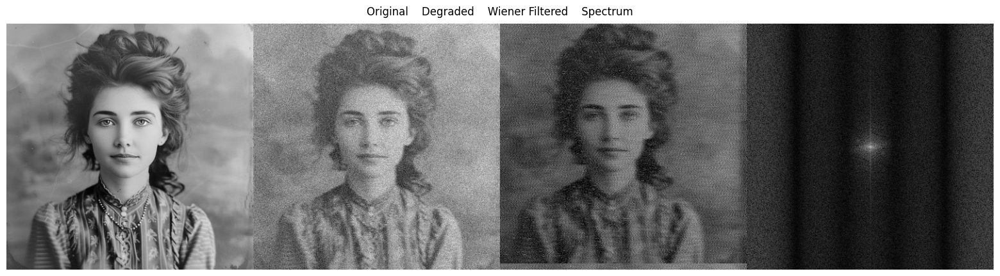

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# Helper functions
def normalize_image(img):
    return (img - np.min(img)) / (np.max(img) - np.min(img))

def add_gaussian_noise(image, mean=0, std=0.02):
    noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + noise
    return noisy_image

def wiener_filter(degraded_img, H, K=0.01):
    """
    Apply Wiener filtering.
    Parameters:
        degraded_img: 2D array, the degraded image.
        H: 2D array, the degradation filter in frequency domain.
        K: float, the noise-to-signal power ratio.
    Returns:
        Restored image.
    """
    # Transform degraded image to frequency domain
    G = np.fft.fft2(degraded_img)

    # Ensure H is properly shifted
    H = np.fft.fftshift(H)

    # Wiener filter formula
    H_conj = np.conj(H)
    wiener = H_conj / (np.abs(H)**2 + K)

    # Apply filter
    X_est = G * wiener

    # Transform back to spatial domain
    restored = np.abs(np.fft.ifft2(X_est))

    return restored

# Load a grayscale image (replace with your own)
if image.ndim == 3:  # Convert to grayscale if needed
    image = np.mean(image, axis=2)

# Normalize the image
gray_image = normalize_image(image)

# Create a degradation filter (motion blur)
def create_motion_blur_filter(size, angle):
    psf = np.zeros((size, size))
    center = size // 2
    for i in range(size):
        offset = int((i - center) * np.tan(np.radians(angle)))
        if 0 <= center + offset < size:
            psf[center, center + offset] = 1
    psf /= psf.sum()
    return psf

filter_size = 21
angle = 15
psf = create_motion_blur_filter(filter_size, angle)

# Convolve image with motion blur filter
degraded_img = convolve2d(gray_image, psf, mode='same', boundary='wrap')

# Add Gaussian noise
degraded_img = add_gaussian_noise(degraded_img, mean=0, std=0.1)

# Transform PSF to frequency domain
Hf = np.fft.fft2(psf, s=gray_image.shape)

# Apply Wiener filter
wiener_img = wiener_filter(degraded_img, Hf, K=5)

# For visualization
wiener_spectrum = np.log(1 + np.abs(np.fft.fftshift(np.fft.fft2(wiener_img))))

# Stack and display results
res = np.hstack((
    normalize_image(gray_image),
    normalize_image(degraded_img),
    normalize_image(wiener_img),
    normalize_image(wiener_spectrum)
))

plt.figure(figsize=(20, 5))
plt.imshow(res, cmap='gray')
plt.title('Original    Degraded    Wiener Filtered    Spectrum', pad=10)
plt.axis('off')
plt.show()


##Φιλτράρισμα ελαχίστων τετραγώνων υπό περιορισμούς

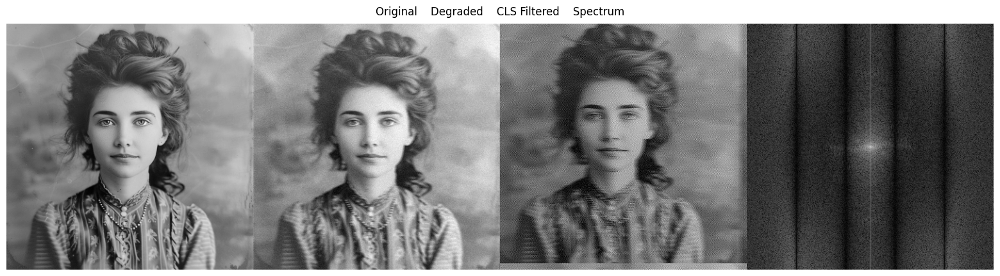

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# Helper functions
def normalize_image(img):
    return (img - np.min(img)) / (np.max(img) - np.min(img))

def add_gaussian_noise(image, mean=0, std=0.02):
    noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + noise
    return noisy_image

def constrained_least_squares_filter(degraded_img, H, P, gamma=0.01):
    """
    Apply Constrained Least Squares filtering.
    Parameters:
        degraded_img: 2D array, the degraded image.
        H: 2D array, the degradation filter in frequency domain.
        P: 2D array, the Laplacian operator in frequency domain.
        gamma: float, the regularization parameter.
    Returns:
        Restored image.
    """
    # Transform degraded image to frequency domain
    G = np.fft.fft2(degraded_img)

    # Ensure H and P are properly shifted
    H = np.fft.fftshift(H)
    P = np.fft.fftshift(P)

    # Constrained Least Squares filter formula
    cls_filter = np.conj(H) / (np.abs(H)**2 + gamma * np.abs(P)**2)

    # Apply filter
    X_est = G * cls_filter

    # Transform back to spatial domain
    restored = np.abs(np.fft.ifft2(X_est))

    return restored

# Load a grayscale image (replace with your own)
if image.ndim == 3:  # Convert to grayscale if needed
    image = np.mean(image, axis=2)

# Normalize the image
gray_image = normalize_image(image)

# Create a degradation filter (motion blur)
def create_motion_blur_filter(size, angle):
    psf = np.zeros((size, size))
    center = size // 2
    for i in range(size):
        offset = int((i - center) * np.tan(np.radians(angle)))
        if 0 <= center + offset < size:
            psf[center, center + offset] = 1
    psf /= psf.sum()
    return psf

filter_size = 21
angle = 15
psf = create_motion_blur_filter(filter_size, angle)

# Convolve image with motion blur filter
degraded_img = convolve2d(gray_image, psf, mode='same', boundary='wrap')

# Add Gaussian noise
degraded_img = add_gaussian_noise(degraded_img, mean=0, std=0.02)

# Transform PSF to frequency domain
Hf = np.fft.fft2(psf, s=gray_image.shape)

# Create Laplacian operator in frequency domain
laplacian = np.array([[0, -1, 0], [-1, 4, -1], [0, -1, 0]])
P = np.fft.fft2(laplacian, s=gray_image.shape)

# Apply Constrained Least Squares filter
cls_img = constrained_least_squares_filter(degraded_img, Hf, P, gamma=0.01)

# For visualization
cls_spectrum = np.log(1 + np.abs(np.fft.fftshift(np.fft.fft2(cls_img))))

# Stack and display results
res = np.hstack((
    normalize_image(gray_image),
    normalize_image(degraded_img),
    normalize_image(cls_img),
    normalize_image(cls_spectrum)
))

plt.figure(figsize=(20, 5))
plt.imshow(res, cmap='gray')
plt.title('Original    Degraded    CLS Filtered    Spectrum', pad=10)
plt.axis('off')
plt.show()



## Φίλτρο γεωμετρικού μέσου στο πεδίο της συχνότητας

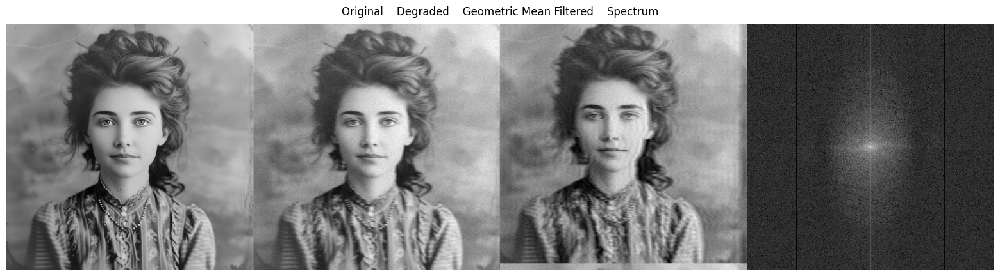

In [24]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# Helper functions
def normalize_image(img):
    return (img - np.min(img)) / (np.max(img) - np.min(img))

def add_gaussian_noise(image, mean=0, std=0.02):
    noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + noise
    return noisy_image

def geometric_mean_filter(degraded_img, H, alpha=0.5):
    """
    Apply Geometric Mean filter.
    Parameters:
        degraded_img: 2D array, the degraded image.
        H: 2D array, the degradation filter in frequency domain.
        alpha: float, the weight for the noise suppression.
    Returns:
        Restored image.
    """
    # Transform degraded image to frequency domain
    G = np.fft.fft2(degraded_img)

    # Ensure H is properly shifted
    H = np.fft.fftshift(H)

    # Geometric Mean filter formula
    H_conj = np.conj(H)
    denominator = (np.abs(H)**2)**alpha

    # Avoid division by zero
    denominator[denominator == 0] = 1e-10

    geo_filter = H_conj / denominator

    # Apply filter
    X_est = G * geo_filter

    # Transform back to spatial domain
    restored = np.abs(np.fft.ifft2(X_est))

    return restored

# Load a grayscale image (replace with your own)
if image.ndim == 3:  # Convert to grayscale if needed
    image = np.mean(image, axis=2)

# Normalize the image
gray_image = normalize_image(image)

# Create a degradation filter (motion blur)
def create_motion_blur_filter(size, angle):
    psf = np.zeros((size, size))
    center = size // 2
    for i in range(size):
        offset = int((i - center) * np.tan(np.radians(angle)))
        if 0 <= center + offset < size:
            psf[center, center + offset] = 1
    psf /= psf.sum()
    return psf

filter_size = 21
angle = 15
psf = create_motion_blur_filter(filter_size, angle)

# Convolve image with motion blur filter
degraded_img = convolve2d(gray_image, psf, mode='same', boundary='wrap')

# Add Gaussian noise
degraded_img = add_gaussian_noise(degraded_img, mean=0, std=0.02)

# Transform PSF to frequency domain
Hf = np.fft.fft2(psf, s=gray_image.shape)

# Apply Geometric Mean filter
geo_img = geometric_mean_filter(degraded_img, Hf, alpha=0.5)

# For visualization
geo_spectrum = np.log(1 + np.abs(np.fft.fftshift(np.fft.fft2(geo_img))))

# Stack and display results
res = np.hstack((
    normalize_image(gray_image),
    normalize_image(degraded_img),
    normalize_image(geo_img),
    normalize_image(geo_spectrum)
))

plt.figure(figsize=(20, 5))
plt.imshow(res, cmap='gray')
plt.title('Original    Degraded    Geometric Mean Filtered    Spectrum', pad=10)
plt.axis('off')
plt.show()